In [1]:
import sys
  
# setting path
sys.path.append('../')

In [2]:
import os
import time
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import librosa
import IPython.display
from pydub import AudioSegment

from utils.audio import Audio
from utils.hparams import HParam

import torch
import torch.nn as nn

from utils.power_law_loss import PowerLawCompLoss
from model.model import VoiceFilter
from model.embedder import SpeechEmbedder
from mir_eval.separation import bss_eval_sources

In [3]:
hp = HParam("../config.yaml")

../utils/hparams.py:18: YAMLLoadWarning: calling yaml.load_all() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  for doc in docs:


# Preparation

In [4]:
dataset_df = pd.read_csv("LibriSpeechGenerateDataset.csv")

In [5]:

dataset_df['target_max_value']=None
dataset_df['interference_max_value']=None
dataset_df['target_interference_max_value_ratio']=None


In [6]:
def getaudio(sample, base_fix="../"):
    sr = hp.audio.sample_rate
    s1_dvec = base_fix+sample["embedding_utterance_path"]
    s1_target = base_fix+sample["clean_utterance_path"]
    s2 = base_fix+sample["interference_utterance_path"]
    l1 = sample["clean_segment"]
    l2 = sample["interference_segment"]
    audio_len = sample["segment_length"]*sr

    d, _ = librosa.load(s1_dvec, sr=sr)
    w1, _ = librosa.load(s1_target, sr=sr)
    w2, _ = librosa.load(s2, sr=sr)

    d, _ = librosa.effects.trim(d, top_db=20)
    w1, _ = librosa.effects.trim(w1, top_db=20)
    w2, _ = librosa.effects.trim(w2, top_db=20)

    # Mix 2 audio, then trim to match clean audio length
    w1, w2 = w1[l1:l1+audio_len], w2[l2:l2+audio_len]
    mixed = w1 + w2
    
    df_filter=((dataset_df["embedding_utterance_path"]==sample["embedding_utterance_path"])&
              (dataset_df["clean_utterance_path"]==sample["clean_utterance_path"])&
              (dataset_df["interference_utterance_path"]==sample["interference_utterance_path"]))
    dataset_df.loc[df_filter,'target_max_value']=np.max(np.abs(w1))
    dataset_df.loc[df_filter,'interference_max_value']=np.max(np.abs(w2))
    dataset_df.loc[df_filter,'target_interference_max_value_ratio']=np.max(np.abs(w1))/np.max(np.abs(w2))
    
    
    
    norm = np.max(np.abs(mixed)) * 1.1
    w1, w2, mixed = w1/norm, w2/norm, mixed/norm

    return d, w1, mixed, w2

In [7]:
with open("Generate_test.json", "r") as f:
    test_result = json.load(f)

for key in list(test_result.keys()):
    test_result[key] = np.array(test_result[key])
    if "losses" in key:
        test_result[key] = np.mean(test_result[key])
    else:
        dataset_df[key] = test_result[key]
        if "sdrs" in key and "before" not in key and "improve" not in key:
            dataset_df[key+"_improve"] = dataset_df[key] - dataset_df["sdrs_before"]
            
            
            

In [8]:
def statistic(arr):
    print("Mean: ", arr.mean())
    print("Median: ", np.median(arr))
    _ = plt.hist(arr, bins=100)
    plt.show()

In [9]:
device = "cpu"

embedder_pt = torch.load("../embedder.pt", device)
embedder = SpeechEmbedder(hp)
embedder.load_state_dict(embedder_pt)
embedder.eval()

# Power-law compressed loss
model = VoiceFilter(hp)
checkpoint = torch.load("../chkpt/powlaw_loss/chkpt_168000.pt", device)
model.load_state_dict(checkpoint['model'])
model.eval()

# Power-law compressed loss fine-tune
model_f = VoiceFilter(hp)
checkpoint = torch.load("../chkpt/powlaw_loss_finetune/chkpt_178000.pt", device)
model_f.load_state_dict(checkpoint['model'])
model_f.eval()


# First try (MSE loss)
model_0 = VoiceFilter(hp)
checkpoint = torch.load("../chkpt/new_dataloader/chkpt_108000.pt", device)
model_0.load_state_dict(checkpoint['model'])
model_0.eval()

# MSE ver 48k (ms.Tam)
model_t = VoiceFilter(hp)
checkpoint = torch.load("../chkpt/mstam_mse/chkpt_48000.pt", device)
model_t.load_state_dict(checkpoint['model'])
model_t.eval()

pass

In [10]:
audio = Audio(hp)

In [11]:
def preprocess(d, mixed):
    dvec_mel = audio.get_mel(d)
    dvec_mel = torch.from_numpy(dvec_mel).float()

    mixed_mag, mixed_phase = audio.wav2spec(mixed)
    mixed_stft = audio.stft(mixed).T
    
    return dvec_mel, torch.from_numpy(mixed_mag), torch.from_numpy(mixed_phase), torch.from_numpy(mixed_stft)

In [12]:
def powerlaw_inference(model, d, mixed):
    criterion = PowerLawCompLoss()
    
    dvec_mel, mixed_mag, mixed_phase, mixed_stft = preprocess(d, mixed)
    
    dvec = embedder(dvec_mel)
    dvec = dvec.unsqueeze(0)
    mixed_stft = mixed_stft.unsqueeze(0)
    
    est_mask = model(torch.pow(mixed_stft.abs(), 0.3), dvec)
    est_mask = torch.pow(est_mask, 10/3)
    est_stft = mixed_stft * est_mask

    mixed_stft = mixed_stft[0].numpy()
    est_stft = est_stft[0].detach().numpy()
    est_wav = audio._istft(est_stft.T, length=mixed.shape[0])

    return est_wav

In [13]:
def mse_inference(model, d, mixed):
    criterion = nn.MSELoss()
    
    dvec_mel, mixed_mag, mixed_phase, mixed_stft = preprocess(d, mixed)
    
    dvec = embedder(dvec_mel)
    dvec = dvec.unsqueeze(0)
    mixed_mag = mixed_mag.unsqueeze(0)
    
    est_mask = model(mixed_mag, dvec)
    est_mag = mixed_mag * est_mask
    
    mixed_mag = mixed_mag[0].numpy()
    est_mag = est_mag[0].detach().numpy()
    mixed_phase = mixed_phase.numpy()
    est_wav = audio.spec2wav(est_mag, mixed_phase, length=mixed.shape[0])

    return est_wav

In [29]:
def inference_detail(sample, *, save:bool):
    def getcurrent():
        return time.strftime("%Y%m%d_%H%M%SUTC", time.localtime())
    
    def export_audio(w, fname):
        AudioSegment(
            IPython.display.Audio(w, rate=16000).data,
            frame_rate=16000,
            sample_width=2,
            channels=1
        ).export(
            os.path.join(folder, fname),
            format="wav"
        )
    
    d, w1, mix, w2 = getaudio(sample)
    IPython.display.display(sample)
    print("Mixed audio")
    IPython.display.display(IPython.display.Audio(mix, rate=16000,normalize=False))
    plt.specgram(mix,Fs=16000)
    plt.show()
    print("Target audio")
    IPython.display.display(IPython.display.Audio(w1, rate=16000,normalize=False))
    plt.specgram(w1,Fs=16000)
    plt.show()
    print("Ref audio")
    IPython.display.display(IPython.display.Audio(d, rate=16000,normalize=False))
    plt.specgram(d,Fs=16000)
    plt.show()
    print("Power-law predict")
    p_pred = powerlaw_inference(model, d, mix)
    IPython.display.display(IPython.display.Audio(p_pred, rate=16000,normalize=False))
    plt.specgram(p_pred,Fs=16000)
    plt.show()
    print("Power-law fine-tune predict")
    f_pred = powerlaw_inference(model_f, d, mix)
    IPython.display.display(IPython.display.Audio(f_pred, rate=16000,normalize=False))
    plt.specgram(f_pred,Fs=16000)
    plt.show()
    print("MSE predict")
    m0_pred = mse_inference(model_0, d, mix)
    IPython.display.display(IPython.display.Audio(m0_pred, rate=16000,normalize=False))
    plt.specgram(m0_pred,Fs=16000)
    plt.show()
    print("MSE ms.T predict")
    t_pred = mse_inference(model_t, d, mix)
    IPython.display.display(IPython.display.Audio(t_pred, rate=16000,normalize=False))
    plt.specgram(t_pred,Fs=16000)
    plt.show()
    
    # Save inference result to folder
    if save:
        folder = getcurrent()
        os.mkdir(folder)
        with open(os.path.join(folder, "log.txt"), "w") as f:
            for key in sample.keys():
                f.write(key + ':\t' + str(sample[key])+"\n")
                
        export_audio(mix, "mixed_audio.wav")
        export_audio(w1, "target_audio.wav")
        export_audio(d, "dvec_audio.wav")
        export_audio(w2, "interf_audio.wav")
        export_audio(p_pred, "pred_powlaw_audio.wav")
        export_audio(f_pred, "pred_finetune_audio.wav")
        export_audio(m0_pred, "pred_mse_audio.wav")
#        export_audio(t_pred, "pred_mset_audio.wav")
        
    return d, w1, mix, p_pred, f_pred, m0_pred, t_pred

In [15]:
def getaudio_enhance_audio(sample, base_fix="../",target=None,embedding=None):
    sr = hp.audio.sample_rate
    s1_dvec = base_fix+sample["embedding_utterance_path"]
    s1_target = base_fix+sample["clean_utterance_path"]
    s2 = base_fix+sample["interference_utterance_path"]
    l1 = sample["clean_segment"]
    l2 = sample["interference_segment"]
    audio_len = sample["segment_length"]*sr

    d, _ = librosa.load(s1_dvec, sr=sr)
    w1, _ = librosa.load(s1_target, sr=sr)
    w2, _ = librosa.load(s2, sr=sr)

    d, _ = librosa.effects.trim(d, top_db=20)
    w1, _ = librosa.effects.trim(w1, top_db=20)
    w2, _ = librosa.effects.trim(w2, top_db=20)
    
    
    if target:
        w1=w1*target*(np.max(np.abs(w2))/np.max(np.abs(w1)))
        
    if embedding:
        d=d/np.max(np.abs(d))
    
    
    # Mix 2 audio, then trim to match clean audio length
    w1, w2 = w1[l1:l1+audio_len], w2[l2:l2+audio_len]
    mixed = w1 + w2
    


        
    norm = np.max(np.abs(mixed)) * 1.1
    w1, w2, mixed = w1/norm, w2/norm, mixed/norm

    return d, w1, mixed, w2




In [16]:
def inference_detail_enhance(sample, *, save:bool,target=None,embedding=None):
    def getcurrent():
        return time.strftime("%Y%m%d_%H%M%SUTC", time.localtime())
    
    def export_audio(w, fname):
        AudioSegment(
            IPython.display.Audio(w, rate=16000).data,
            frame_rate=16000,
            sample_width=2,
            channels=1
        ).export(
            os.path.join(folder, fname),
            format="wav"
        )
    
    d, w1, mix, w2 = getaudio_enhance_audio(sample,target=target,embedding=embedding)
    
    
    print("Mixed audio")
    print('SDR Before: ',bss_eval_sources(w1,mix,False)[0][0])
    IPython.display.display(IPython.display.Audio(mix, rate=16000,normalize=False))
    plt.specgram(mix,Fs=16000)
    plt.show()
    print("Target audio")
    IPython.display.display(IPython.display.Audio(w1, rate=16000,normalize=False))
    plt.specgram(w1,Fs=16000)
    plt.show()
    print("Ref audio")
    IPython.display.display(IPython.display.Audio(d, rate=16000,normalize=False))
    plt.specgram(d,Fs=16000)
    plt.show()
    print("Power-law predict")
    p_pred = powerlaw_inference(model, d, mix)
    print('SDR Power-law: ',bss_eval_sources(w1,p_pred,False)[0][0])
    IPython.display.display(IPython.display.Audio(p_pred, rate=16000,normalize=False))
    plt.specgram(p_pred,Fs=16000)
    plt.show()
    print("Power-law fine-tune predict")
    f_pred = powerlaw_inference(model_f, d, mix)
    print('SDR Power-law fine-tune: ',bss_eval_sources(w1,f_pred,False)[0][0])
    IPython.display.display(IPython.display.Audio(f_pred, rate=16000,normalize=False))
    plt.specgram(f_pred,Fs=16000)
    plt.show()
    print("MSE predict")
    m0_pred = mse_inference(model_0, d, mix)
    print('SDR MSE: ',bss_eval_sources(w1,m0_pred,False)[0][0])
    IPython.display.display(IPython.display.Audio(m0_pred, rate=16000,normalize=False))
    plt.specgram(m0_pred,Fs=16000)
    plt.show()
    print("MSE ms.T predict")
    t_pred = mse_inference(model_t, d, mix)
    print('SDR MSE ms.T: ',bss_eval_sources(w1,t_pred,False)[0][0])
    IPython.display.display(IPython.display.Audio(t_pred, rate=16000,normalize=False))
    plt.specgram(t_pred,Fs=16000)
    plt.show()
    
    # Save inference result to folder
    if save:
        folder = getcurrent()
        os.mkdir(folder)
        with open(os.path.join(folder, "log.txt"), "w") as f:
            for key in sample.keys():
                f.write(key + ':\t' + str(sample[key])+"\n")
                
        export_audio(mix, "mixed_audio.wav")
        export_audio(w1, "target_audio.wav")
        export_audio(d, "dvec_audio.wav")
        export_audio(w2, "interf_audio.wav")
        export_audio(p_pred, "pred_powlaw_audio.wav")
        export_audio(f_pred, "pred_finetune_audio.wav")
        export_audio(m0_pred, "pred_mse_audio.wav")
#        export_audio(t_pred, "pred_mset_audio.wav")
        
    return d, w1, mix, p_pred, f_pred, m0_pred, t_pred

In [17]:
def sample_detail(sample):
    d, w1, mix, w2 = getaudio(sample)
    df_filter=((dataset_df["embedding_utterance_path"]==sample["embedding_utterance_path"])&
              (dataset_df["clean_utterance_path"]==sample["clean_utterance_path"])&
              (dataset_df["interference_utterance_path"]==sample["interference_utterance_path"]))
    IPython.display.display(dataset_df[df_filter])
    print("Mixed audio")
    IPython.display.display(IPython.display.Audio(mix, rate=16000,normalize=False))
    print("Target audio")
    IPython.display.display(IPython.display.Audio(w1, rate=16000,normalize=False))
    print("Ref audio")
    IPython.display.display(IPython.display.Audio(d, rate=16000,normalize=False))
    print("Interference audio")
    IPython.display.display(IPython.display.Audio(w2, rate=16000,normalize=False))

In [18]:
for index, row in dataset_df.iterrows():
    getaudio(row)

In [19]:
dataset_df["target_max_value"] = pd.to_numeric(dataset_df["target_max_value"], downcast="float")
dataset_df["interference_max_value"] = pd.to_numeric(dataset_df["interference_max_value"], downcast="float")
dataset_df["target_interference_max_value_ratio"] = pd.to_numeric(dataset_df["target_interference_max_value_ratio"], downcast="float")

# Main

Mean:  0.18704699028611121
Median:  0.11525456132660314


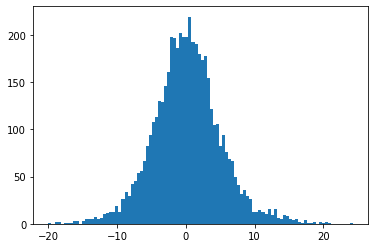

In [112]:
statistic(dataset_df["sdrs_before"])

In [146]:
filtered_df=dataset_df[(dataset_df["sdrs_before"]>=-1)&(dataset_df["sdrs_before"]<=1)]
best_improved=filtered_df[filtered_df["sdrs_p_improve"]==filtered_df["sdrs_p_improve"].max()]
worst_improved=filtered_df[filtered_df["sdrs_p_improve"]==filtered_df["sdrs_p_improve"].min()]
insignificant_change=filtered_df[np.abs(filtered_df["sdrs_p_improve"])<=0.1]

In [128]:
pd.set_option('display.max_colwidth', None)

In [147]:
insignificant_change

,clean_utterance_path,embedding_utterance_path,interference_utterance_path,clean_segment,interference_segment,segment_length,target_max_value,interference_max_value,target_interference_max_value_ratio,sdrs_before,sdrs_p,sdrs_p_improve,sdrs_0,sdrs_0_improve,sdrs_t,sdrs_t_improve,sdrs_f,sdrs_f_improve
2243,datasets/LibriSpeech/dev-clean/6241/61946/6241-61946-0022.flac,datasets/LibriSpeech/dev-clean/6241/61943/6241-61943-0012.flac,datasets/LibriSpeech/test-clean/61/70968/61-70968-0008.flac,17939,1403,3,0.486023,0.376709,1.290182,-0.393064,-0.46542,-0.072357,-0.450685,-0.057621,-0.193272,0.199792,-2.165937,-1.772873


clean_utterance_path                   datasets/LibriSpeech/dev-clean/6241/61946/6241-61946-0022.flac
embedding_utterance_path               datasets/LibriSpeech/dev-clean/6241/61943/6241-61943-0012.flac
interference_utterance_path               datasets/LibriSpeech/test-clean/61/70968/61-70968-0008.flac
clean_segment                                                                                   17939
interference_segment                                                                             1403
segment_length                                                                                      3
target_max_value                                                                             0.486023
interference_max_value                                                                       0.376709
target_interference_max_value_ratio                                                          1.290182
sdrs_before                                                                       

Mixed audio


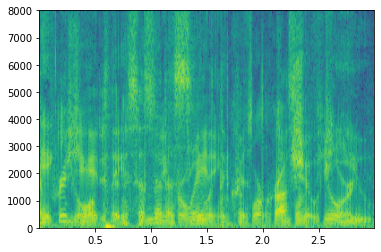

Target audio


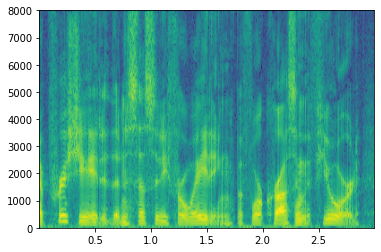

Ref audio


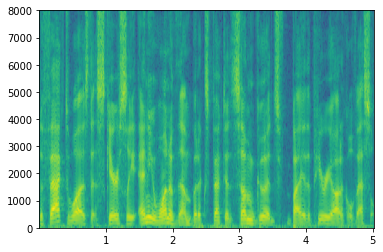

Power-law predict


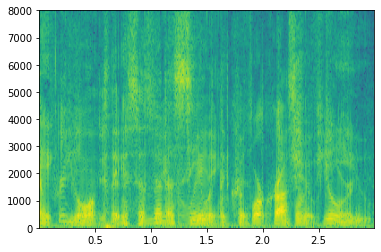

Power-law fine-tune predict


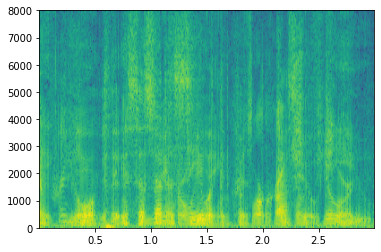

MSE predict


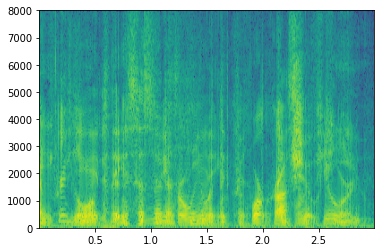

MSE ms.T predict


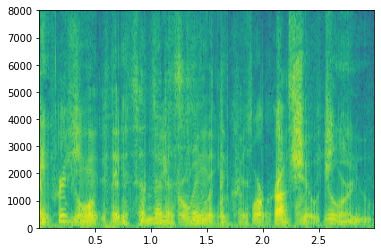

(array([-0.00488281, -0.00619507, -0.00473022, ..., -0.03826904,
        -0.03051758, -0.02914429], dtype=float32),
 array([-0.04769732, -0.02056111,  0.00094726, ..., -0.00022288,
         0.00161591,  0.00501491], dtype=float32),
 array([-0.03482573,  0.00089154, -0.0658067 , ...,  0.00295322,
         0.00122587,  0.00245173], dtype=float32),
 array([-0.02350554, -0.00510656, -0.0392057 , ..., -0.00042592,
        -0.00111816, -0.00042273], dtype=float32),
 array([-0.01342193,  0.00246666, -0.02316777, ...,  0.00162843,
         0.00142377,  0.00193339], dtype=float32),
 array([-0.0080022 , -0.00594146, -0.03062118, ...,  0.00190089,
         0.00177388,  0.00205606], dtype=float32),
 array([-0.01042496,  0.00527391, -0.0314936 , ...,  0.00089495,
         0.00051848,  0.00106288], dtype=float32))

In [148]:
inference_detail(insignificant_change.iloc[0], save=True)

Mean:  7.4863178640003945
Median:  8.207073775668361


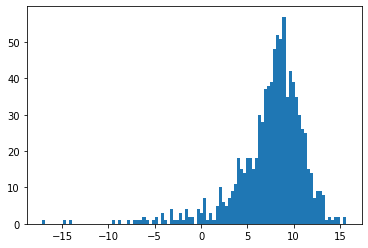

In [119]:
statistic(filtered_df["sdrs_p_improve"])

Mean:  6.351959455827941
Median:  7.131359619585962


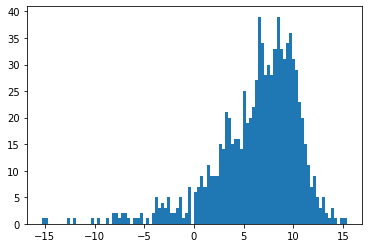

In [120]:
statistic(filtered_df["sdrs_f_improve"])

In [95]:
filter_low_target=dataset_df[(dataset_df["target_interference_max_value_ratio"]>=0.1)&(dataset_df["target_interference_max_value_ratio"]<0.5)]
filt=dataset_df[dataset_df["target_interference_max_value_ratio"]<0.1]
filter_medium_target=dataset_df[(dataset_df["target_interference_max_value_ratio"]>=0.5)&(dataset_df["target_interference_max_value_ratio"]<2)]
filter_large_target=dataset_df[(dataset_df["target_interference_max_value_ratio"]>=2)]

In [101]:
filter_medium_target.shape[0]/(filt.shape[0]+filter_low_target.shape[0]+filter_medium_target.shape[0]+filter_large_target.shape[0])

0.832

In [108]:
filter_medium_target.mean()

/tmp/ipykernel_2164650/1830680413.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  filter_medium_target.mean()


clean_segment                          44533.917308
interference_segment                   43269.774279
segment_length                             3.000000
target_max_value                           0.462685
interference_max_value                     0.466413
target_interference_max_value_ratio        1.051538
sdrs_before                                0.076756
sdrs_p                                     8.054654
sdrs_p_improve                             7.977897
sdrs_0                                     3.994314
sdrs_0_improve                             3.917558
sdrs_t                                     3.263583
sdrs_t_improve                             3.186827
sdrs_f                                     6.922533
sdrs_f_improve                             6.845777
dtype: float64

clean_utterance_path                   datasets/LibriSpeech/dev-clean/3000/15664/3000...
embedding_utterance_path               datasets/LibriSpeech/dev-clean/3000/15664/3000...
interference_utterance_path            datasets/LibriSpeech/test-clean/8555/292519/85...
clean_segment                                                                        881
interference_segment                                                               12347
segment_length                                                                         3
target_max_value                                                                0.665436
interference_max_value                                                          0.198334
target_interference_max_value_ratio                                             3.355132
sdrs_before                                                                     6.955813
sdrs_p                                                                         12.350941
sdrs_p_improve       

Mixed audio


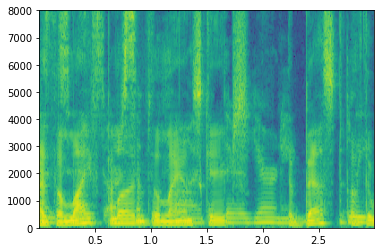

Target audio


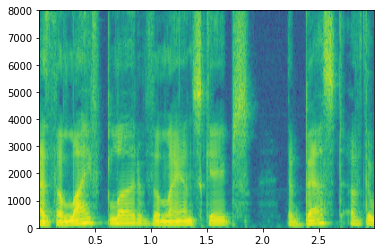

Ref audio


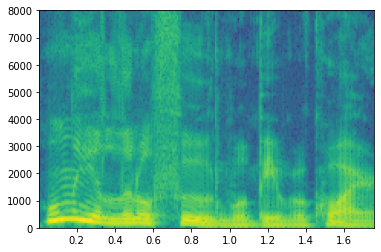

Power-law predict


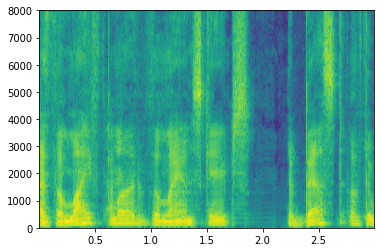

Power-law fine-tune predict


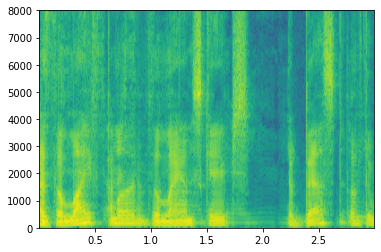

MSE predict


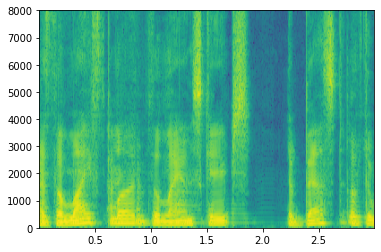

MSE ms.T predict


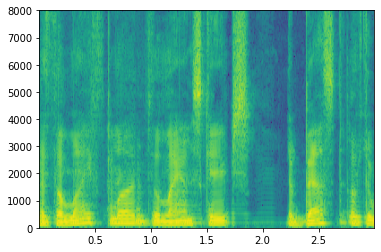

(array([-1.2207031e-04,  9.1552734e-05, -3.0517578e-05, ...,
        -1.4831543e-02, -1.6845703e-02, -1.7303467e-02], dtype=float32),
 array([-0.09003616, -0.07976888, -0.07236979, ...,  0.16905682,
         0.18651536,  0.20339194], dtype=float32),
 array([-0.29276302, -0.27073202, -0.23394439, ...,  0.17508417,
         0.19200233,  0.2085048 ], dtype=float32),
 array([-0.26308346, -0.24111383, -0.20475052, ...,  0.16830242,
         0.18111406,  0.19322385], dtype=float32),
 array([-0.26846862, -0.24687377, -0.21053101, ...,  0.04189897,
         0.04798734,  0.05432926], dtype=float32),
 array([-0.12410298, -0.11451259, -0.09984545, ...,  0.10561993,
         0.11565989,  0.12482432], dtype=float32),
 array([-0.07867769, -0.07605394, -0.07392824, ...,  0.15716101,
         0.17074397,  0.18397316], dtype=float32))

In [106]:
inference_detail(filter_large_target.iloc[4], save=True)

## Đánh giá input

Phân phối chất lượng input (SDR)

In [6]:
dataset_df

,clean_utterance_path,embedding_utterance_path,interference_utterance_path,clean_segment,interference_segment,segment_length,sdrs_before,sdrs_p,sdrs_p_improve,sdrs_0,sdrs_0_improve,sdrs_t,sdrs_t_improve,sdrs_f,sdrs_f_improve,pow-l d-norm,pow-l finetune d-norm,mse d-norm,mse ms.T d-norm
0,datasets/LibriSpeech/test-clean/3570/5694/3570...,datasets/LibriSpeech/test-clean/3570/5694/3570...,datasets/LibriSpeech/dev-clean/2803/154328/280...,1944,1688,3,1.780261,7.454370,5.674109,4.955418,3.175156,4.022746,2.242485,7.387296,5.607035,7.238134,7.258864,4.948548,4.246220
1,datasets/LibriSpeech/test-clean/8555/292519/85...,datasets/LibriSpeech/test-clean/8555/284449/85...,datasets/LibriSpeech/test-clean/1284/1181/1284...,24203,4193,3,-2.546793,3.882370,6.429163,1.253119,3.799913,-0.023236,2.523557,4.324702,6.871496,6.774508,6.221952,1.272807,0.393296
2,datasets/LibriSpeech/test-clean/237/134500/237...,datasets/LibriSpeech/test-clean/237/134500/237...,datasets/LibriSpeech/test-clean/5639/40744/563...,9941,18585,3,12.930058,12.726913,-0.203145,5.903068,-7.026990,5.406780,-7.523278,15.734968,2.804910,12.286897,16.033722,5.188757,4.893109
3,datasets/LibriSpeech/dev-clean/6319/57405/6319...,datasets/LibriSpeech/dev-clean/6319/57405/6319...,datasets/LibriSpeech/test-clean/7729/102255/77...,1372,39022,3,1.826658,10.807392,8.980734,6.185962,4.359304,5.835593,4.008935,7.940766,6.114108,10.801712,10.006999,6.080545,5.788320
4,datasets/LibriSpeech/test-clean/1089/134691/10...,datasets/LibriSpeech/test-clean/1089/134691/10...,datasets/LibriSpeech/test-clean/8555/284449/85...,8656,517,3,-3.807322,6.418759,10.226081,2.808281,6.615602,2.751367,6.558688,6.438119,10.245441,6.347269,6.475866,2.757351,2.630418
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,datasets/LibriSpeech/dev-clean/3000/15664/3000...,datasets/LibriSpeech/dev-clean/3000/15664/3000...,datasets/LibriSpeech/test-clean/8224/274381/82...,59370,143586,3,-1.938115,3.530383,5.468498,1.745715,3.683830,-0.978414,0.959700,-1.005064,0.933050,3.255420,-1.430255,1.634669,-0.731419
4996,datasets/LibriSpeech/dev-clean/3853/163249/385...,datasets/LibriSpeech/dev-clean/3853/163249/385...,datasets/LibriSpeech/dev-clean/6313/66129/6313...,17754,50005,3,18.450411,21.262293,2.811882,6.530823,-11.919588,4.757709,-13.692702,21.605214,3.154803,21.199077,21.586250,6.211260,4.536903
4997,datasets/LibriSpeech/test-clean/2300/131720/23...,datasets/LibriSpeech/test-clean/2300/131720/23...,datasets/LibriSpeech/test-clean/908/157963/908...,20472,28591,3,3.221593,6.322213,3.100620,5.811177,2.589584,4.384579,1.162986,6.359405,3.137812,6.242090,6.231417,5.423916,4.363466
4998,datasets/LibriSpeech/dev-clean/1919/142785/191...,datasets/LibriSpeech/dev-clean/1919/142785/191...,datasets/LibriSpeech/dev-clean/3576/138058/357...,30211,28910,3,-1.217106,7.862892,9.079998,7.186013,8.403119,6.992782,8.209888,6.593119,7.810225,7.698554,4.296134,5.480868,5.602423


Mean:  0.18704699028611121
Median:  0.11525456132660314


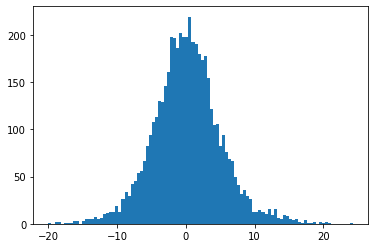

In [19]:
statistic(dataset_df["sdrs_before"])

Nghe thử 1 audio chất lượng kém nhất

In [20]:
sample_detail(dataset_df[dataset_df["sdrs_before"] < -15].iloc[0])

,clean_utterance_path,embedding_utterance_path,interference_utterance_path,clean_segment,interference_segment,segment_length,target_max_value,interference_max_value,target_interference_max_value_ratio,sdrs_before,sdrs_p,sdrs_p_improve,sdrs_0,sdrs_0_improve,sdrs_t,sdrs_t_improve,sdrs_f,sdrs_f_improve
290,datasets/LibriSpeech/dev-clean/3081/166546/308...,datasets/LibriSpeech/dev-clean/3081/166546/308...,datasets/LibriSpeech/test-clean/6930/81414/693...,39349,67125,3,0.096375,0.701691,0.137346,-15.896867,0.408857,16.305724,-0.952674,14.944192,0.175997,16.072864,1.131748,17.028614


Mixed audio


Target audio


Ref audio


Interference audio


Nghe thử 1 audio chất lượng trung bình

In [21]:
sample_detail(dataset_df[(dataset_df["sdrs_before"] < 0.5) & (dataset_df["sdrs_before"] > -0.5)].iloc[0])

,clean_utterance_path,embedding_utterance_path,interference_utterance_path,clean_segment,interference_segment,segment_length,target_max_value,interference_max_value,target_interference_max_value_ratio,sdrs_before,sdrs_p,sdrs_p_improve,sdrs_0,sdrs_0_improve,sdrs_t,sdrs_t_improve,sdrs_f,sdrs_f_improve
22,datasets/LibriSpeech/test-clean/3570/5695/3570...,datasets/LibriSpeech/test-clean/3570/5696/3570...,datasets/LibriSpeech/dev-clean/3000/15664/3000...,233554,118055,3,0.470978,0.596161,0.790018,0.351927,11.051064,10.699138,5.954991,5.603064,4.482072,4.130145,10.666209,10.314283


Mixed audio


Target audio


Ref audio


Interference audio


Nghe thử 1 audio chất lượng tốt sẵn

In [22]:
sample_detail(dataset_df[dataset_df["sdrs_before"] > 10].iloc[0])

,clean_utterance_path,embedding_utterance_path,interference_utterance_path,clean_segment,interference_segment,segment_length,target_max_value,interference_max_value,target_interference_max_value_ratio,sdrs_before,sdrs_p,sdrs_p_improve,sdrs_0,sdrs_0_improve,sdrs_t,sdrs_t_improve,sdrs_f,sdrs_f_improve
2,datasets/LibriSpeech/test-clean/237/134500/237...,datasets/LibriSpeech/test-clean/237/134500/237...,datasets/LibriSpeech/test-clean/5639/40744/563...,9941,18585,3,0.434418,0.193512,2.244914,12.930058,12.726913,-0.203145,5.903068,-7.02699,5.40678,-7.523278,15.734968,2.80491


Mixed audio


Target audio


Ref audio


Interference audio


Nghe thử 1 audio chất lượng quá tốt (outlier)

In [23]:
sample_detail(dataset_df[dataset_df["sdrs_before"] > 20].iloc[0])

,clean_utterance_path,embedding_utterance_path,interference_utterance_path,clean_segment,interference_segment,segment_length,target_max_value,interference_max_value,target_interference_max_value_ratio,sdrs_before,sdrs_p,sdrs_p_improve,sdrs_0,sdrs_0_improve,sdrs_t,sdrs_t_improve,sdrs_f,sdrs_f_improve
2709,datasets/LibriSpeech/dev-clean/3853/163249/385...,datasets/LibriSpeech/dev-clean/3853/163249/385...,datasets/LibriSpeech/test-clean/237/126133/237...,6616,11093,3,0.809265,0.227875,3.551359,21.074491,16.652866,-4.421625,5.053257,-16.021234,4.059172,-17.015319,22.3027,1.228209


Mixed audio


Target audio


Ref audio


Interference audio


Kết luận: 

## Đánh giá chất lượng của model sử dụng Power-law loss gốc

Mean:  8.127350849600585
Median:  8.500130586117473


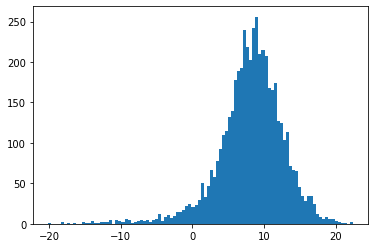

Mean:  7.940303859314477
Median:  8.264885217677858


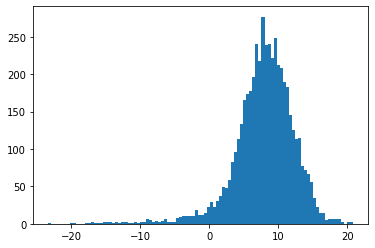

In [7]:
statistic(dataset_df["sdrs_p"])
statistic(dataset_df["sdrs_p_improve"])

## Đánh giá chất lượng của model sử dụng Power-law loss có fine-tune trên data Vin và tập train của ZaloAI

Mean:  7.037916628933008
Median:  7.526833324043938


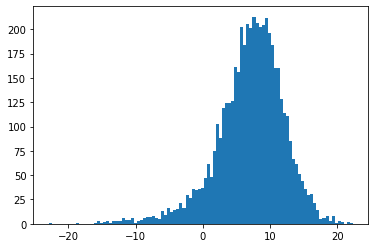

Mean:  6.8508696386468975
Median:  7.338138450997103


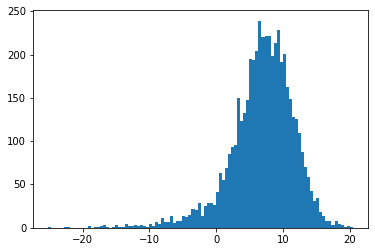

In [9]:
statistic(dataset_df["sdrs_f"])
statistic(dataset_df["sdrs_f_improve"])

## Đánh giá chất lượng của model sử dụng MSE loss gốc

Mean:  4.0194519834253235
Median:  4.351912152943332


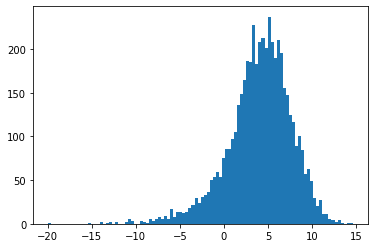

Mean:  3.8324049931392126
Median:  3.960737061291386


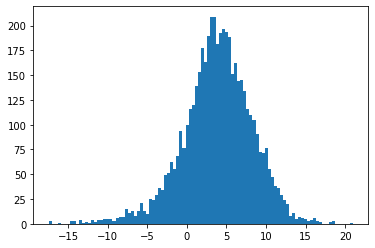

In [11]:
statistic(dataset_df["sdrs_0"])
statistic(dataset_df["sdrs_0_improve"])

## Đánh giá chất lượng của model sử dụng MSE loss gốc (c Tâm train)

Mean:  3.2168560656735288
Median:  3.6386354206162475


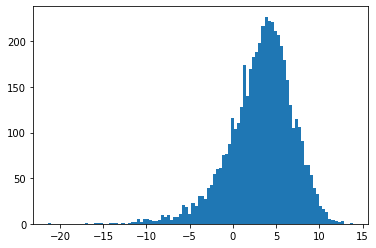

Mean:  3.029809075387418
Median:  3.30693740668365


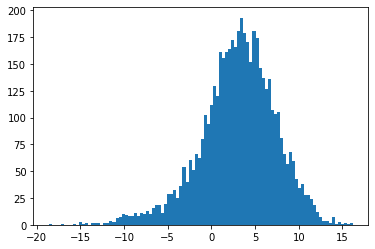

In [13]:
statistic(dataset_df["sdrs_t"])
statistic(dataset_df["sdrs_t_improve"])

## Nghe thử chất lượng audio inference của các model

In [29]:
low_sdr_samples = dataset_df[dataset_df["sdrs_before"] < -15]
low_sdr_samples

,clean_utterance_path,embedding_utterance_path,interference_utterance_path,clean_segment,interference_segment,segment_length,target_max_value,interference_max_value,target_interference_max_value_ratio,sdrs_before,sdrs_p,sdrs_p_improve,sdrs_0,sdrs_0_improve,sdrs_t,sdrs_t_improve,sdrs_f,sdrs_f_improve
290,datasets/LibriSpeech/dev-clean/3081/166546/308...,datasets/LibriSpeech/dev-clean/3081/166546/308...,datasets/LibriSpeech/test-clean/6930/81414/693...,39349,67125,3,0.096375,0.701691,0.137346,-15.896867,0.408857,16.305724,-0.952674,14.944192,0.175997,16.072864,1.131748,17.028614
369,datasets/LibriSpeech/dev-clean/1993/147149/199...,datasets/LibriSpeech/dev-clean/1993/147149/199...,datasets/LibriSpeech/dev-clean/2277/149897/227...,102665,521,3,0.029999,0.558350,0.053728,-18.976521,-20.095791,-1.119270,-19.911334,-0.934813,-21.327920,-2.351400,-8.520360,10.456160
771,datasets/LibriSpeech/dev-clean/3081/166546/308...,datasets/LibriSpeech/dev-clean/3081/166546/308...,datasets/LibriSpeech/dev-clean/3853/163249/385...,164,11607,3,0.084320,0.807739,0.104390,-17.717642,-4.711161,13.006481,-10.562777,7.154865,-15.082477,2.635165,-5.674375,12.043267
877,datasets/LibriSpeech/dev-clean/3081/166546/308...,datasets/LibriSpeech/dev-clean/3081/166546/308...,datasets/LibriSpeech/dev-clean/251/137823/251-...,82426,3877,3,0.129242,0.669434,0.193062,-16.169469,4.596770,20.766239,4.793998,20.963467,0.030318,16.199787,4.270813,20.440282
1056,datasets/LibriSpeech/dev-clean/1993/147149/199...,datasets/LibriSpeech/dev-clean/1993/147966/199...,datasets/LibriSpeech/dev-clean/3853/163249/385...,5110,8589,3,0.060394,0.730591,0.082665,-16.090532,-18.264692,-2.174160,-13.907878,2.182653,-12.711190,3.379341,-22.959830,-6.869299
1197,datasets/LibriSpeech/dev-clean/1993/147149/199...,datasets/LibriSpeech/dev-clean/1993/147149/199...,datasets/LibriSpeech/test-clean/8463/294828/84...,17729,18385,3,0.060730,0.480133,0.126486,-17.277353,2.911165,20.188518,1.291993,18.569346,-4.033445,13.243908,2.655759,19.933111
1469,datasets/LibriSpeech/dev-clean/1993/147149/199...,datasets/LibriSpeech/dev-clean/1993/147149/199...,datasets/LibriSpeech/dev-clean/7976/105575/797...,106104,908,3,0.029999,0.485382,0.061804,-18.554859,-1.329770,17.225089,-5.528542,13.026318,-16.030497,2.524363,-2.273013,16.281847
1827,datasets/LibriSpeech/dev-clean/1993/147149/199...,datasets/LibriSpeech/dev-clean/1993/147965/199...,datasets/LibriSpeech/test-clean/1221/135766/12...,66092,69588,3,0.033478,0.337952,0.099061,-15.589678,-3.870669,11.719008,-7.708822,7.880856,-11.641040,3.948637,-15.278592,0.311085
2026,datasets/LibriSpeech/dev-clean/1993/147149/199...,datasets/LibriSpeech/dev-clean/1993/147966/199...,datasets/LibriSpeech/dev-clean/1673/143396/167...,14405,140538,3,0.035736,0.800415,0.044647,-18.599600,-8.740897,9.858703,-13.198043,5.401557,-13.561088,5.038512,-5.396175,13.203425
2272,datasets/LibriSpeech/dev-clean/777/126732/777-...,datasets/LibriSpeech/dev-clean/777/126732/777-...,datasets/LibriSpeech/dev-clean/3853/163249/385...,11830,50359,3,0.197235,0.715820,0.275537,-16.473827,1.869557,18.343383,-2.417834,14.055993,-9.392412,7.081414,2.381312,18.855139


Mixed audio
SDR Before:  -15.896866539779817


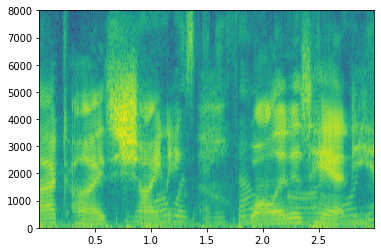

Target audio


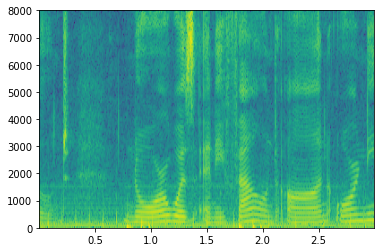

Ref audio


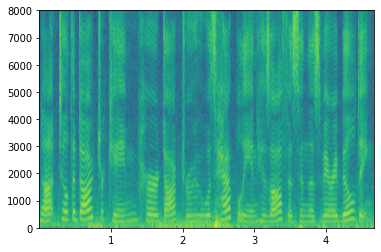

Power-law predict
SDR Power-law:  0.4091409972613588


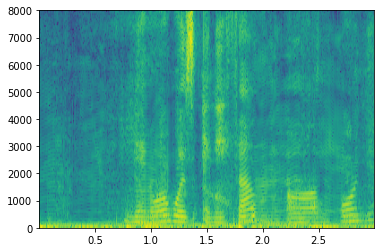

Power-law fine-tune predict
SDR Power-law fine-tune:  1.1308096479634095


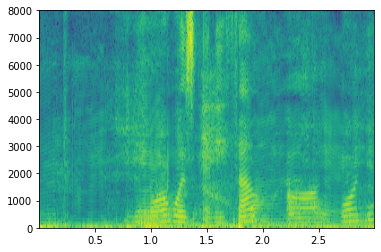

MSE predict
SDR MSE:  -0.9534948984571603


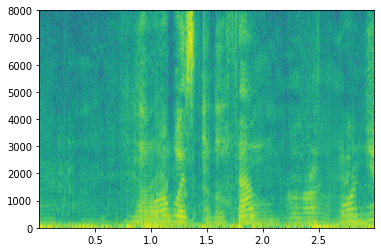

MSE ms.T predict
SDR MSE ms.T:  0.17480364468523107


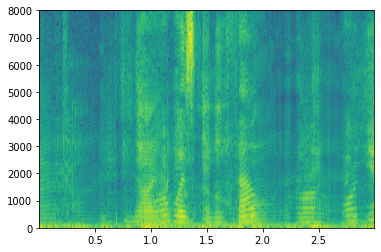

(array([-0.00430298, -0.00360107, -0.00311279, ...,  0.00183105,
         0.00204468,  0.0022583 ], dtype=float32),
 array([-0.00047547,  0.00067358, -0.0014264 , ...,  0.01604698,
         0.01212438,  0.01149043], dtype=float32),
 array([-0.03007322, -0.06141435, -0.08962533, ...,  0.02626949,
        -0.00380373, -0.01343191], dtype=float32),
 array([-0.01793276, -0.01880675, -0.01876932, ...,  0.00397869,
         0.00217458,  0.00362483], dtype=float32),
 array([-0.0123843 , -0.01378539, -0.01388655, ...,  0.00255397,
         0.00129177,  0.00216222], dtype=float32),
 array([-0.01252261, -0.01340744, -0.0133742 , ...,  0.00784176,
         0.00138132,  0.00053166], dtype=float32),
 array([-0.00619399, -0.0068458 , -0.00678142, ...,  0.00636766,
         0.00145323,  0.00284659], dtype=float32))

In [32]:
inference_detail_enhance(low_sdr_samples.iloc[0],save=False)

Mixed audio
SDR Before:  6.7758435939882755


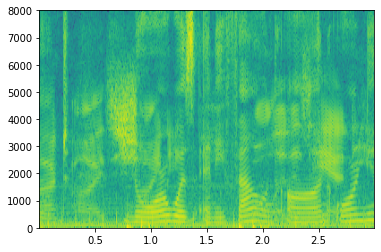

Target audio


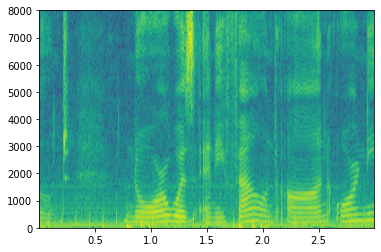

Ref audio


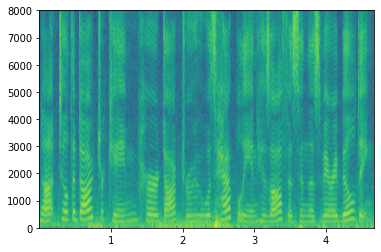

Power-law predict
SDR Power-law:  13.055646183340253


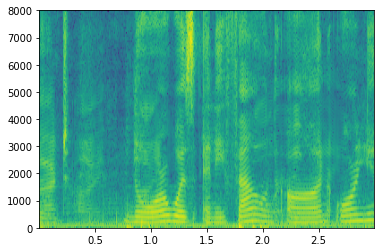

Power-law fine-tune predict
SDR Power-law fine-tune:  12.379259406843046


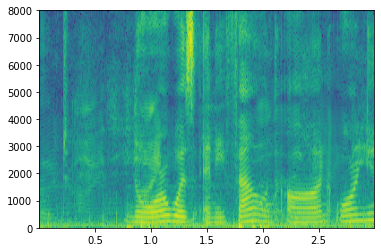

MSE predict
SDR MSE:  10.339803499574721


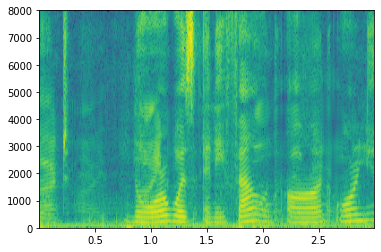

MSE ms.T predict
SDR MSE ms.T:  8.563661074757132


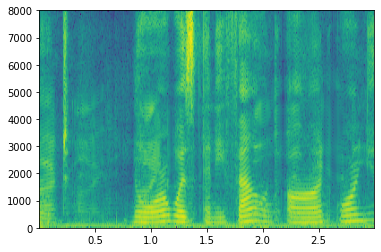

(array([-0.00430298, -0.00360107, -0.00311279, ...,  0.00183105,
         0.00204468,  0.0022583 ], dtype=float32),
 array([-0.00344603,  0.00488187, -0.01033808, ...,  0.1163034 ,
         0.08787368,  0.08327898], dtype=float32),
 array([-0.0181961 , -0.02605972, -0.05429212, ...,  0.1213978 ,
         0.07993589,  0.0708589 ], dtype=float32),
 array([-0.01145708, -0.01792765, -0.04338801, ...,  0.09153402,
         0.06368657,  0.06213276], dtype=float32),
 array([-0.01105319, -0.01109816, -0.01393068, ...,  0.09781042,
         0.07974718,  0.07029772], dtype=float32),
 array([-0.00852894, -0.01530252, -0.04050805, ...,  0.05859709,
         0.03366016,  0.03460962], dtype=float32),
 array([-0.01292741, -0.0209621 , -0.03594225, ...,  0.0603547 ,
         0.03681402,  0.0379594 ], dtype=float32))

In [33]:
inference_detail_enhance(low_sdr_samples.iloc[0],save=False,target=2)

Mixed audio
SDR Before:  6.7758435939882755


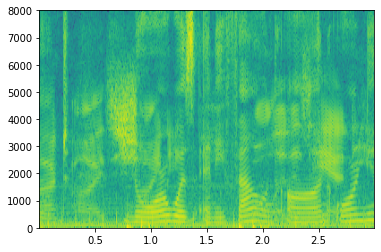

Target audio


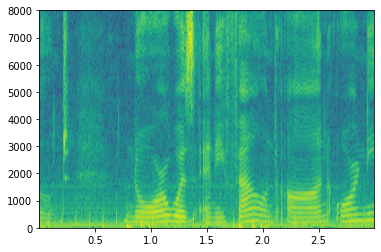

Ref audio


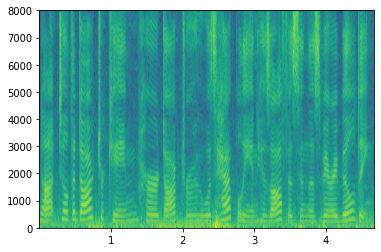

Power-law predict
SDR Power-law:  13.512355376529484


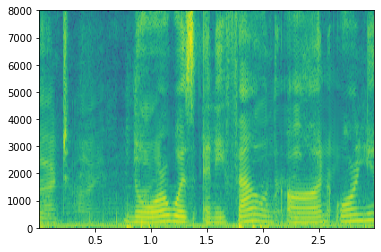

Power-law fine-tune predict
SDR Power-law fine-tune:  12.668943947243756


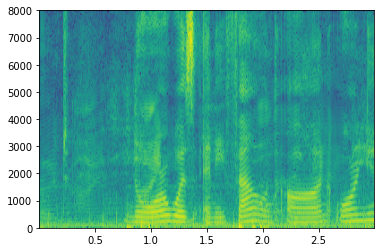

MSE predict
SDR MSE:  11.082294481972434


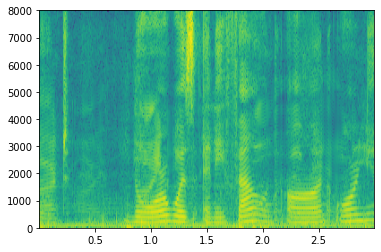

MSE ms.T predict
SDR MSE ms.T:  8.998937440730279


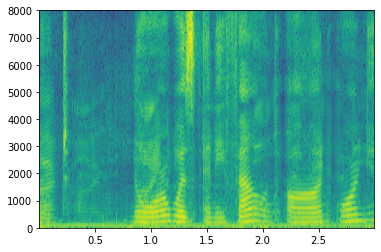

(array([-0.0128591 , -0.01076151, -0.00930233, ...,  0.00547196,
         0.00611035,  0.00674875], dtype=float32),
 array([-0.00344603,  0.00488187, -0.01033808, ...,  0.1163034 ,
         0.08787368,  0.08327898], dtype=float32),
 array([-0.0181961 , -0.02605972, -0.05429212, ...,  0.1213978 ,
         0.07993589,  0.0708589 ], dtype=float32),
 array([-0.01310293, -0.01899574, -0.04274357, ...,  0.09232061,
         0.0643445 ,  0.0633207 ], dtype=float32),
 array([-0.01230661, -0.01235182, -0.0147212 , ...,  0.09894864,
         0.08083702,  0.06943682], dtype=float32),
 array([-0.01568906, -0.02076589, -0.04043636, ...,  0.06157456,
         0.03866117,  0.03761722], dtype=float32),
 array([-0.01479266, -0.02393296, -0.03946136, ...,  0.07202953,
         0.04981538,  0.04826445], dtype=float32))

In [34]:
inference_detail_enhance(low_sdr_samples.iloc[0],save=False,target=2,embedding=1)

Mixed audio
SDR Before:  -15.896866544880675


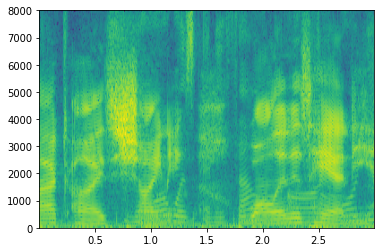

Target audio


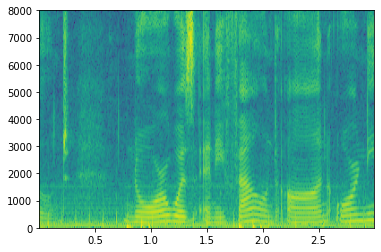

Ref audio


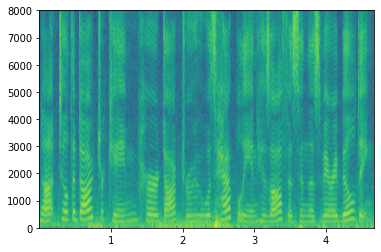

Power-law predict
SDR Power-law:  0.40914091489312515


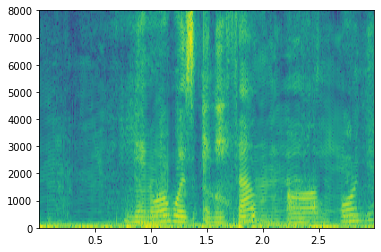

Power-law fine-tune predict
SDR Power-law fine-tune:  1.1308098449403627


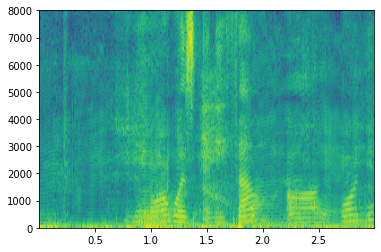

MSE predict
SDR MSE:  -0.9534946961457508


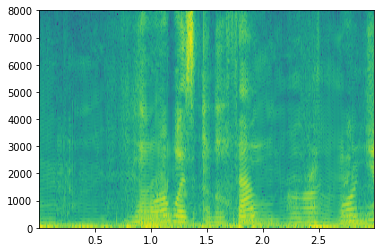

MSE ms.T predict
SDR MSE ms.T:  0.17480281281739857


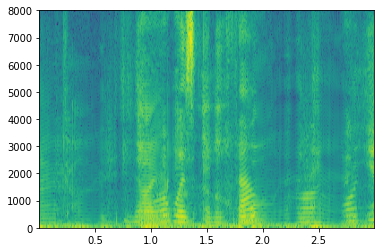

(array([-0.00430298, -0.00360107, -0.00311279, ...,  0.00183105,
         0.00204468,  0.0022583 ], dtype=float32),
 array([-0.00047547,  0.00067358, -0.0014264 , ...,  0.01604698,
         0.01212438,  0.01149043], dtype=float32),
 array([-0.03007322, -0.06141435, -0.08962534, ...,  0.02626949,
        -0.00380373, -0.01343191], dtype=float32),
 array([-0.01793276, -0.01880675, -0.01876932, ...,  0.00397868,
         0.00217458,  0.00362483], dtype=float32),
 array([-0.0123843 , -0.01378539, -0.01388655, ...,  0.00255397,
         0.00129177,  0.00216222], dtype=float32),
 array([-0.01252261, -0.01340744, -0.0133742 , ...,  0.00784176,
         0.00138133,  0.00053167], dtype=float32),
 array([-0.00619399, -0.0068458 , -0.00678142, ...,  0.00636766,
         0.00145323,  0.00284659], dtype=float32))

In [32]:
inference_detail_enhance(low_sdr_samples.iloc[0],save=False,target=10,embedding=1)

Mixed audio
SDR Before:  -15.896866544880675


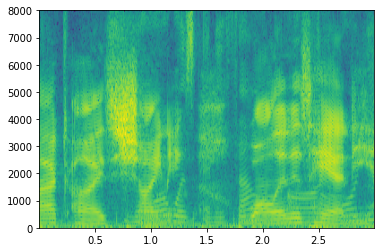

Target audio


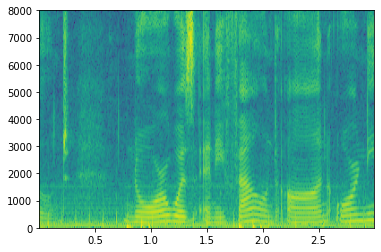

Ref audio


ValueError: Audio data must be between -1 and 1 when normalize=False.

In [35]:
inference_detail_enhance(low_sdr_samples.iloc[0],save=False,target=20,embedding=1)

In [ ]:
inference_detail(low_sdr_samples.iloc[0], save=False)
pass

In [ ]:
inference_detail(low_sdr_samples.iloc[1], save=False)
pass

In [ ]:
inference_detail(low_sdr_samples.iloc[3], save=False)
pass

In [ ]:
abnormal_sdr_samples = dataset_df[dataset_df["sdrs_before"] > 20]
abnormal_sdr_samples

In [ ]:
inference_detail(abnormal_sdr_samples.iloc[0], save=False)
pass

In [ ]:
inference_detail(abnormal_sdr_samples.iloc[2], save=False)
pass

In [ ]:
p_best_improve_samples = dataset_df[dataset_df["sdrs_p_improve"] > 20]
p_best_improve_samples

In [ ]:
inference_detail(p_best_improve_samples.iloc[-1], save=False)
pass

In [ ]:
p_worse_improve_samples = dataset_df[dataset_df["sdrs_p_improve"] < -20]
p_worse_improve_samples

In [ ]:
inference_detail(p_worse_improve_samples.iloc[0], save=False)
pass

In [ ]:
inference_detail(p_worse_improve_samples.iloc[1], save=False)
pass